In [1]:
import iris
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.patches as patch

import numpy as np
import os


import cartopy.crs as ccrs
import cartopy.feature as cfeature

from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import matplotlib as mpl

from cartopy.util import add_cyclic_point
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER


import sys
sys.path.insert(0,'/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/classes/')
from simulation_dictionary import tejen, tejeo, deglg, deglh, loveclim, iloveclim, iloveclim_fwf, iloveclim_uniform, iloveclim_fwf_glac, iloveclim_uniform_glac, famous, itrace, trace, mpi08, mpi10, mpi11, mpi12, miroc, uvic_short, uvic_long
import data_SAT_3D_dictionary as ddict_sat
import data_SST_3D_dictionary as ddict_sst
import variable_dictionary as vdict
sys.path.insert(0,'/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/')
import hadcm3_functions as hf 
import loveclim_functions as lf
import itrace_functions as itf
import functions_for_comparisons as func4comp
import matplotlib.gridspec as gridspec

In [2]:
import math  
import sklearn.metrics  


In [3]:
lon = np.load('/nfs/annie/ee19b2s/work/data/pmip_proj_hs1/1degree_lon.npy')
lat = np.load('/nfs/annie/ee19b2s/work/data/pmip_proj_hs1/1degree_lat.npy')

In [4]:
var = 'global_3D_sst10'


to_clip = ddict_sst.iloveclim_fwf[var]
iloveclim_fwf_sst_with_nans = np.zeros((to_clip.shape[0],to_clip.shape[1],to_clip.shape[2]))

for i in range(to_clip.shape[0]):
    for j in range(to_clip.shape[1]):
        for k in range(to_clip.shape[2]):
            if to_clip[i,j,k] >= -100:
                iloveclim_fwf_sst_with_nans[i,j,k] = to_clip[i,j,k]
            else:
                iloveclim_fwf_sst_with_nans[i,j,k] = np.nan

to_clip = ddict_sst.iloveclim_uniform[var]
iloveclim_uni_sst_with_nans = np.zeros((to_clip.shape[0],to_clip.shape[1],to_clip.shape[2]))

for i in range(to_clip.shape[0]):
    for j in range(to_clip.shape[1]):
        for k in range(to_clip.shape[2]):
            if to_clip[i,j,k] >= -100:
                iloveclim_uni_sst_with_nans[i,j,k] = to_clip[i,j,k]
            else:
                iloveclim_uni_sst_with_nans[i,j,k] = np.nan
                


In [5]:
timeperiods_ka = [18, 17, 16, 15]

var = 'global_3D_sst10'
ddict = ddict_sst
if_precip=False
is_absolute=False
tejen_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.tejen[var], tejen['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
#tejeo_anom_from_lgm, _ = func4comp.calc_anom_for_maps(ddict.tejeo[var][:,0,:,:], sdict.tejeo['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglg[var], deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglh[var], deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

famous_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.famous[var], famous['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

loveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.loveclim[var], loveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_fwf_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(iloveclim_fwf_sst_with_nans, iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(iloveclim_uni_sst_with_nans, iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf_glac[var], iloveclim_fwf_glac['time10'][0:910], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform_glac[var], iloveclim_uniform_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


itrace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.itrace[var], itrace['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
trace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.trace[var], trace['time10_short'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

miroc_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.miroc[var], miroc['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

#mpi08_at_timesteps, _ = func4comp.calc_anom_for_maps(ddict.mpi08[var+'0'], mpi08['time100'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
mpi10_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi10[var], mpi10['time10'][0:1208], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi11_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi11[var], mpi11['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi12_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi12[var], mpi12['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


uvic_short_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_short[var], uvic_short['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
uvic_long_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_long[var], uvic_long['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

In [6]:
data_list_sst = [tejen_at_timesteps, loveclim_at_timesteps, itrace_at_timesteps, trace_at_timesteps, deglg_at_timesteps, mpi10_at_timesteps,iloveclim_uni_glac_at_timesteps, iloveclim_uni_at_timesteps, mpi11_at_timesteps, deglh_at_timesteps, iloveclim_fwf_at_timesteps, iloveclim_fwf_glac_at_timesteps, mpi12_at_timesteps, famous_at_timesteps, miroc_at_timesteps] #, uvic_short_at_timesteps, uvic_long_at_timesteps]

In [7]:
timeperiods_ka = [18, 17, 16, 15]

var = 'global_3D_temp10'
ddict = ddict_sat
if_precip=False
is_absolute=False
tejen_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.tejen[var], tejen['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
#tejeo_anom_from_lgm, _ = func4comp.calc_anom_for_maps(ddict.tejeo[var][:,0,:,:], sdict.tejeo['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglg[var], deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.deglh[var], deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

famous_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.famous[var], famous['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

loveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.loveclim[var], loveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_fwf_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform[var], iloveclim['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

iloveclim_fwf_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_fwf_glac[var], iloveclim_fwf_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
iloveclim_uni_glac_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.iloveclim_uniform_glac[var], iloveclim_uniform_glac['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


itrace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.itrace[var], itrace['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
trace_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.trace[var], trace['time10_short'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

miroc_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.miroc[var], miroc['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

#mpi08_at_timesteps, _ = func4comp.calc_anom_for_maps(ddict.mpi08[var+'0'], mpi08['time100'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
mpi10_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi10[var], mpi10['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi11_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi11[var], mpi11['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

mpi12_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.mpi12[var], mpi12['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


uvic_short_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_short[var], uvic_short['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
uvic_long_at_timesteps, _ = func4comp.calc_anom_for_maps20ka_long(ddict.uvic_long[var], uvic_long['time10'], timeperiods=timeperiods_ka, timestep='centennial', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

In [8]:
data_list_sat = [tejen_at_timesteps, loveclim_at_timesteps, itrace_at_timesteps, trace_at_timesteps, deglg_at_timesteps, mpi10_at_timesteps,iloveclim_uni_glac_at_timesteps, iloveclim_uni_at_timesteps, mpi11_at_timesteps, deglh_at_timesteps, iloveclim_fwf_at_timesteps, iloveclim_fwf_glac_at_timesteps, mpi12_at_timesteps, famous_at_timesteps, miroc_at_timesteps]#,uvic_short_at_timesteps, uvic_long_at_timesteps]

In [9]:
## select timesteps and find 50 year averages at those points
## find multi model means at those timesteps
## use means to calculate variances
## calculate anomalies from multi model means

expts = [tejen,loveclim,itrace,trace,deglg,mpi10,iloveclim_uniform,iloveclim_uniform_glac,iloveclim_fwf,iloveclim_fwf_glac,deglh,mpi11,mpi12,famous,miroc]#,uvic_short,uvic_long]


In [10]:
import pandas as pd

fn_shakun = '/nfs/annie/ee19b2s/work/data/downloaded_data/shakun_surface_temp/shakun_surface_temp_stack.xls'
shakun_stack = pd.read_excel(fn_shakun, sheet_name=None)
shakun_stack.keys()
#keys = np.array(shakun_stack.keys())
keys = list(shakun_stack.keys())[3:]

all_lats = []
all_lons = []
all_temp = []

for i,key in enumerate(keys):
    record_df = shakun_stack[key]
    print(record_df)
    time = np.array(record_df['Published age'][1:])
    try:
        temperature = record_df['Temperature'][1:]
    except:
        try:
            temperature = record_df['Published Temperature'][1:]
        except:
            temperature = record_df['Published temperature'][1:]


    lgm_index = hf.find_nearest_value(time, 20000)
    lgm_index2 = hf.find_nearest_value(time, 19500)

    if lgm_index != lgm_index2:
        temp_from_lgm = temperature - np.nanmean(temperature[lgm_index2:lgm_index])
        
        index_18ka = hf.find_nearest_value(time, 18000)
        index_17ka = hf.find_nearest_value(time, 17000)
        index_16ka = hf.find_nearest_value(time, 16000)
        index_15ka = hf.find_nearest_value(time, 15000)

        temp_at_time = [temp_from_lgm[index_18ka], temp_from_lgm[index_17ka], temp_from_lgm[index_16ka], temp_from_lgm[index_15ka]]

        lat_loc = shakun_stack['METADATA']['Lat'][i]
        lon_loc = shakun_stack['METADATA']['Lon'][i]

        all_lats.append(lat_loc)
        all_lons.append(lon_loc)
        all_temp.append(temp_at_time)
    else:
        if time[lgm_index] < 19400:
            pass
        else:
            temp_from_lgm = temperature - temperature[lgm_index]

            index_18ka = hf.find_nearest_value(time, 18000)
            index_17ka = hf.find_nearest_value(time, 17000)
            index_16ka = hf.find_nearest_value(time, 16000)
            index_15ka = hf.find_nearest_value(time, 15000)

            temp_at_time = [temp_from_lgm[index_18ka], temp_from_lgm[index_17ka], temp_from_lgm[index_16ka], temp_from_lgm[index_15ka]]

            lat_loc = shakun_stack['METADATA']['Lat'][i]
            lon_loc = shakun_stack['METADATA']['Lon'][i]

            all_lats.append(lat_loc)
            all_lons.append(lon_loc)
            all_temp.append(temp_at_time)


     Proxy depth       d18O Temperature Published age Age model error
0            (m)    (VSMOW)        (°C)       (yr BP)        (yr, 1σ)
1           7.35     -35.16     -31.838           -30             0.5
2          14.15     -35.82     -33.851           -10             0.5
3           20.4     -35.11    -31.6855            10             0.5
4           26.1     -34.65    -30.2825            30             0.5
...          ...        ...         ...           ...             ...
2996    2425.757 -42.740144  -54.957439         59870          1299.5
2997    2425.949 -41.559531   -51.35657         59890         1300.25
2998    2426.166 -42.858065  -55.317098         59910         1300.25
2999    2426.392 -43.547699  -57.420482         59930          1300.5
3000    2426.604 -43.353868  -56.829297         59950          1300.5

[3001 rows x 5 columns]
     Proxy depth     d18O Temperature Published age Age model error
0            (m)  (VSMOW)        (°C)       (yr BP)        (yr, 1σ)

    Proxy depth  UK'37 Published temperature Published age Marine04 age  \
0          (cm)    NaN                  (°C)       (yr BP)      (yr BP)   
1             3  0.954                  28.7           112    -40.79264   
2            10  0.952                  28.6           372   317.294279   
3            20  0.961                  29.1           629   610.092261   
4            30  0.962                  29.2           858   844.663226   
..          ...    ...                   ...           ...          ...   
233        1363  0.935                  27.7         84990          NaN   
234        1373  0.925                  27.2         85995          NaN   
235        1383  0.929                  27.4         87000          NaN   
236        1393  0.921                    27         88167          NaN   
237        1403  0.945                  28.3         89334          NaN   

    Marine09 age Age model error  Unnamed: 7 14C depth      Material  14C age  \
0        (yr BP)  

In [11]:
temp_at_time=0
record = shakun_stack[keys[5]]
time = np.array(record['Published age'][1:])
temperature = record['Published temperature'][1:]
lgm_index = hf.find_nearest_value(time, 20000)
lgm_index2 = hf.find_nearest_value(time, 19500)

if lgm_index != lgm_index2:
    temp_from_lgm = temperature - np.nanmean(temperature[lgm_index2:lgm_index])
else:
    if time[lgm_index] < 19700:
        pass
    else:
        temp_from_lgm = temperature - temperature[lgm_index]


        index_18ka = hf.find_nearest_value(time, 18000)
        index_17ka = hf.find_nearest_value(time, 17000)
        index_16ka = hf.find_nearest_value(time, 16000)
        index_15ka = hf.find_nearest_value(time, 15000)

        temp_at_time = [temp_from_lgm[index_18ka], temp_from_lgm[index_17ka], temp_from_lgm[index_16ka], temp_from_lgm[index_15ka]]

        temp_at_time

In [12]:
data18ka_sat = []
data17ka_sat = []
data16ka_sat = []
data15ka_sat = []
data18ka_sst = []
data17ka_sst = []
data16ka_sst = []
data15ka_sst = []
for t in range(len(tejen_at_timesteps)):
    for dataSAT,dataSST in zip(data_list_sat, data_list_sst):
        if t == 0:
            data18ka_sat.append(dataSAT[t])
            data18ka_sst.append(dataSST[t])
                        
        elif t == 1:
            data17ka_sat.append(dataSAT[t])
            data17ka_sst.append(dataSST[t])

        elif t == 2:
            data16ka_sat.append(dataSAT[t])
            data16ka_sst.append(dataSST[t])

        elif t == 3:
            data15ka_sat.append(dataSAT[t])
            data15ka_sst.append(dataSST[t])

datas_sat = [np.array(data18ka_sat), np.array(data17ka_sat), np.array(data16ka_sat), np.array(data15ka_sat)]
datas_sst = [np.array(data18ka_sst), np.array(data17ka_sst), np.array(data16ka_sst), np.array(data15ka_sst)]

expt_data_sat = []
expt_data_sst = []
data_SATs = []
data_SSTs = []
for dataSAT,dataSST in zip(data_list_sat, data_list_sst):
    t = 0
    data_SATs.append(dataSAT[t])
    data_SSTs.append(dataSST[t])

    t = 1
    data_SATs.append(dataSAT[t])
    data_SSTs.append(dataSST[t])

    t = 2
    data_SATs.append(dataSAT[t])
    data_SSTs.append(dataSST[t])

    t = 3
    data_SATs.append(dataSAT[t])
    data_SSTs.append(dataSST[t])

    expt_data_sat.append(data_SATs)
    expt_data_sst.append(data_SSTs)
    
    data_SATs = []
    data_SSTs = []


means_sat = []
means_sst = []
for dataSAT, dataSST in zip(datas_sat, datas_sst):
    means_sat.append(np.ma.average(dataSAT, axis=0))
    means_sst.append(np.ma.average(dataSST, axis=0))
    
var18ka_sat = np.std(datas_sat[0], axis=0)
var17ka_sat = np.std(datas_sat[1], axis=0)
var16ka_sat = np.std(datas_sat[2], axis=0)
var15ka_sat = np.std(datas_sat[3], axis=0)
variances_sat = [var18ka_sat, var17ka_sat, var16ka_sat, var15ka_sat]

var18ka_sst = np.std(datas_sst[0], axis=0)
var17ka_sst = np.std(datas_sst[1], axis=0)
var16ka_sst = np.std(datas_sst[2], axis=0)
var15ka_sst = np.std(datas_sst[3], axis=0)
variances_sst = [var18ka_sst, var17ka_sst, var16ka_sst, var15ka_sst]

In [39]:
longitude = np.load('/nfs/annie/ee19b2s/work/data/pmip_proj_hs1/1degree_lon.npy')
latitude = np.load('/nfs/annie/ee19b2s/work/data/pmip_proj_hs1/1degree_lat.npy')



means_all_temps18 = []
model_minus_shakuns_all18 = []

means_all_temps17 = []
model_minus_shakuns_all17 = []

means_all_temps16 = []
model_minus_shakuns_all16 = []

means_all_temps15 = []
model_minus_shakuns_all15 = []

for lon, lat, temp in zip(all_lons, all_lats, all_temp):
    
    if lon < 0:
        converted_lon = 360 + lon
    index_lon = hf.find_nearest_value(longitude,converted_lon)
    index_lat = hf.find_nearest_value(latitude,lat)
    
    model_matching_point = means_sat[0][index_lat, index_lon]
    means_all_temps18.append(model_matching_point)
    model_minus_proxy = model_matching_point - temp[0]
    model_minus_shakuns_all18.append(model_minus_proxy)
    
    model_matching_point = means_sat[1][index_lat, index_lon]
    means_all_temps17.append(model_matching_point)
    model_minus_proxy = model_matching_point - temp[1]
    model_minus_shakuns_all17.append(model_minus_proxy)
    
    model_matching_point = means_sat[2][index_lat, index_lon]
    means_all_temps16.append(model_matching_point)
    model_minus_proxy = model_matching_point - temp[2]
    model_minus_shakuns_all16.append(model_minus_proxy)
    
    model_matching_point = means_sat[3][index_lat, index_lon]
    means_all_temps15.append(model_matching_point)
    model_minus_proxy = model_matching_point - temp[3]
    model_minus_shakuns_all15.append(model_minus_proxy)
    
    

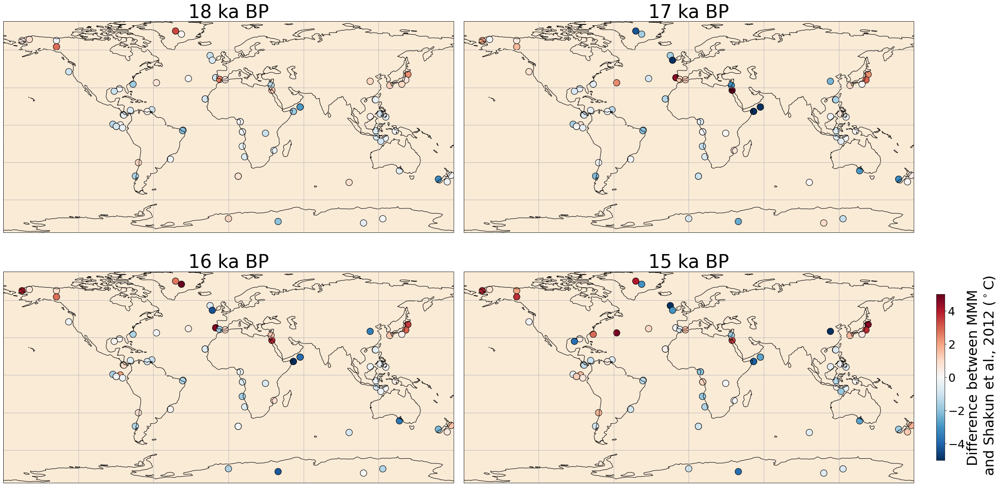

In [40]:
class MidpointNormalize(mpl.colors.Normalize):
    def __init__(self, vmin=None, vmax=None, vcenter=None, clip=False):
        self.vcenter = vcenter
        super().__init__(vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        # Note also that we must extrapolate beyond vmin/vmax
        x, y = [self.vmin, self.vcenter, self.vmax], [0, 0.5, 1.]
        return np.ma.masked_array(np.interp(value, x, y,
                                            left=-np.inf, right=np.inf))

    def inverse(self, value):
        y, x = [self.vmin, self.vcenter, self.vmax], [0, 0.5, 1]
        return np.interp(value, x, y, left=-np.inf, right=np.inf)


orig_map2=plt.cm.get_cmap('RdBu')
reversed_map2 = orig_map2.reversed()
cmap=reversed_map2

import matplotlib.colors as mcolors
fig,axs = plt.subplots(nrows=2,ncols=2,constrained_layout=True, subplot_kw={'projection':ccrs.PlateCarree()})
plt.gcf().set_size_inches(30,15)

normalize = MidpointNormalize(vcenter=0, vmin=-5, vmax=5)
axs[0,0].scatter(all_lons, all_lats, c=model_minus_shakuns_all18, cmap=cmap, edgecolors='black', s=200, norm=normalize)
cbar_contour = axs[0,1].scatter(all_lons, all_lats, c=model_minus_shakuns_all17, cmap=cmap, edgecolors='black', s=200, norm=normalize)
axs[1,0].scatter(all_lons, all_lats, c=model_minus_shakuns_all16, cmap=cmap, edgecolors='black', s=200, norm=normalize)
axs[1,1].scatter(all_lons, all_lats, c=model_minus_shakuns_all15, cmap=cmap, edgecolors='black', s=200, norm=normalize)

cbar = plt.colorbar(cbar_contour, ax=axs[1,1], shrink=.7)
cbar.set_label('Difference between MMM\n and Shakun et al., 2012 ($^\circ$C)', fontsize=30)
cbar.ax.tick_params(labelsize=25)

axs = axs.flat
for i,ax in enumerate(axs):
    ax.coastlines()
    ax.gridlines(draw_labels=False)
    ax.set_title(str(timeperiods_ka[i]) + ' ka BP', fontsize=40)
    ax.set_facecolor('antiquewhite')


panel = plt.gcf()
panel.savefig('/nfs/annie/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_supplementary_figures_pdfs/figS04_MMM_minus_Shakun_global_SAT.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')



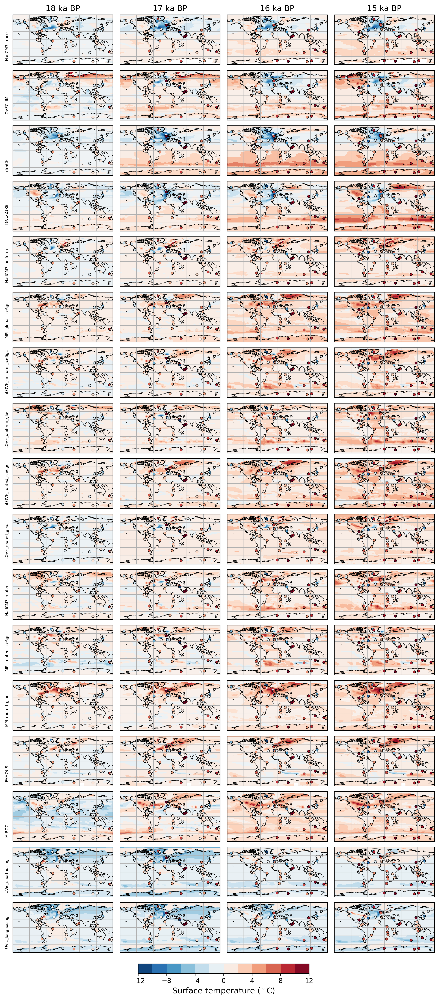

In [42]:
expts = [tejen,loveclim,itrace,trace,deglg,mpi10,iloveclim_uniform,iloveclim_uniform_glac,iloveclim_fwf,iloveclim_fwf_glac,deglh,mpi11,mpi12,famous,miroc,uvic_short,uvic_long]

lon = np.load('/nfs/annie/ee19b2s/work/data/pmip_proj_hs1/1degree_lon.npy')
lat = np.load('/nfs/annie/ee19b2s/work/data/pmip_proj_hs1/1degree_lat.npy')

orig_map2=plt.cm.get_cmap('RdBu')
reversed_map2 = orig_map2.reversed()
variable = vdict.temp_mm_1_5m
cmap = reversed_map2 #variable['cmap']
vmin = -5 #variable['anom_vmin']
vmax = 5 #variable['anom_vmax']
lw_clip = -20
hi_clip = 20
k = 0
space = 0.1
projection = ccrs.PlateCarree()
#projection = ccrs.Orthographic(0,-90)
axes_class = (GeoAxes, dict(map_project=projection))

fig,axgr = plt.subplots(nrows=len(expts),ncols=4, dpi=300,constrained_layout=True, subplot_kw={'projection':projection}, gridspec_kw = {'hspace': 0.1, 'wspace': 0.05})
plt.gcf().set_size_inches(9,20)

for ax,name in zip(axgr[0], timeperiods_ka):
    ax.set_title(str(name) + ' ka BP', fontsize=12)
for i in range(len(expts)):
    plt.gcf().text(-0.08,0.1,expts[i]['label'], fontsize=6, transform=axgr[i,0].transAxes, rotation=90)
axs = axgr.flat

counter = 0
counter2 = 4

#try:
for x in range(len(data_list_sat)):

    for i, ax in enumerate(axs[counter:counter2]):
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.gridlines(draw_labels=False)
        #ax.set_extent([0, 359, -90, -60], crs=ccrs.PlateCarree())

        dataSAT, lons = add_cyclic_point(np.clip(data_list_sat[x][i], lw_clip, hi_clip), coord=lon)
        dataSST, lons = add_cyclic_point(np.clip(data_list_sst[x][i], lw_clip, hi_clip), coord=lon)

        #data, lons = add_cyclic_point(pi_anoms, coord = lon)

        contourSAT = ax.contourf(lons, lat, dataSAT, 12, transform=ccrs.PlateCarree(), cmap = cmap, norm=mpl.colors.CenteredNorm(vcenter = 0, clip = True), vmin=vmin, vmax=vmin) 
        contour = ax.contourf(lons, lat, dataSST, 12, transform=ccrs.PlateCarree(), cmap = cmap, norm=mpl.colors.CenteredNorm(vcenter = 0, clip = True), vmin=vmin, vmax=vmin) 

        if x == 3 and i == 3:
            contour_cbar = contourSAT
    #cbar = plt.colorbar(contour_cbar, ax=axgr[counter:counter2])#, shrink=.9)
    #cbar.set_label(variable['label'], fontsize=20)
    #cbar.ax.tick_params(labelsize=20)
        for z in range(len(all_lons)):
            ax.scatter(all_lons[z], all_lats[z], s=15, c=all_temp[z][i], cmap=contour.cmap, edgecolors='black', linewidth=0.5, zorder=1000, vmin=-5, vmax=5)
        
    

    counter += 4
    counter2 += 4

cbar_ax = fig.add_axes([0.3,-0.02,0.4,0.01])
cbar = fig.colorbar(contour_cbar, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Surface temperature ($^\circ$C)', fontsize=12)
cbar.ax.tick_params(labelsize=10)
panel = plt.gcf()
plt.show()

panel.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_supplementary_figures_pdfs/figS01_surface_temp_wSHAKUN.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')
